# Round 2.5 results
After ProteinMPNN redesign from selected backbones

| Metric | Round1 | Round2 | Round2.5 |
|---|---|---|---|
| Total designs | 2480 | 9520 | 59 |
| ipAE < 5 | 2 (0.08%) | 88 (0.92%) | 22 (37.3%) |
| Pass all filters | 18 (0.73%) | 402 (4.2%) | 50 (87.4%) |
| Backbones with >=1 pass | 15/310 (4.8%) | 190/1190 (16.0%) | 50/59 (84.7%) |

**What to do next**
With 50 passing designs:
1. Redo specificity scoring and compute AF3 stats
2. Combining passing designs from round 2, deep MPNN mining on top backbones — the results so far show that orient_255 and orient_252 variants are the obvious targets. The ordering may change after updated scoring. Running 32–50 sequences per backbone at T=0.1 and 0.2 on the top ~20–30 backbones (those with ≥3 passing sequences) would be the highest-yield next step.

## Calculate ipSAE

In [1]:
import sys
import glob
from pathlib import Path
from collections import OrderedDict
import pandas as pd
from scipy.stats import spearmanr

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 120

# Add the directory containing pmhci_ipsae.py and pae_cutoff_analysis.py
# to the path. Edit this if your scripts are elsewhere.
SCRIPT_DIR = Path(".")   # <-- update if needed
sys.path.insert(0, str(SCRIPT_DIR))

from calc_ipsae import (
    load_pae_matrix, build_chain_slices,
    chain_lengths_from_pdb, score_binder_peptide_ipsae, print_summary,
)

print("Imports OK")

Imports OK


In [2]:
PAE_DIR  = Path("~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/pae")
PDB_DIR  = Path("~/Desktop/pmhc_binder_kras_cp/af_init_guess/inputs/r2.5/threaded_pdbs")

NOMINAL_CUTOFF = 12.0   # Angstroms
DIST_CUTOFF    = 8.0    # Cα distance threshold for crystal contacts (Angstroms)
PEPTIDE_LEN = 9 # VVGADGVGK

In [3]:
# ── Discover design PAE + PDB pairs ─────────────────────────────────────────
npy_files = sorted(PAE_DIR.glob("*_pae.npy"))
pdb_files = []
for npy in npy_files:
    # Corresponding PDB: strip _pae.npy suffix, add .pdb
    stem = npy.stem.replace("_af2pred_pae", "")
    pdb  = PDB_DIR / f"{stem}.pdb"
    pdb_files.append(str(pdb) if pdb.exists() else None)

labels = [Path(n).stem.replace("_pae", "") for n in npy_files]

print(f"Found {len(npy_files)} PAE files")
print(f"  PDB matched: {sum(p is not None for p in pdb_files)} / {len(npy_files)}")
for npy, pdb, label in zip(npy_files, pdb_files, labels):
    pdb_ok = "✓" if pdb else "✗ (no PDB)"
    print(f"  {label:<50s} {pdb_ok}")

Found 59 PAE files
  PDB matched: 59 / 59
  orient_252_pt20__31_sample06_a11_t0.15_s7_af2pred  ✓
  orient_252_pt20__31_sample06_a13_t0.15_s4_af2pred  ✓
  orient_252_pt20__31_sample06_a3_t0.1_s5_af2pred    ✓
  orient_252_pt20__31_sample06_a4_t0.1_s5_af2pred    ✓
  orient_252_pt20__31_sample06_a6_t0.1_s1_af2pred    ✓
  orient_252_pt20__31_sample06_a8_t0.1_s5_af2pred    ✓
  orient_252_pt20__31_sample06_a8_t0.1_s8_af2pred    ✓
  orient_252_pt20__31_sample06_a9_t0.1_s7_af2pred    ✓
  orient_255_pt12__18_sample01_a1_t0.1_s1_af2pred    ✓
  orient_255_pt12__18_sample01_a1_t0.1_s2_af2pred    ✓
  orient_255_pt12__18_sample01_a1_t0.1_s3_af2pred    ✓
  orient_255_pt12__18_sample01_a1_t0.1_s4_af2pred    ✓
  orient_255_pt12__18_sample01_a1_t0.1_s5_af2pred    ✓
  orient_255_pt12__18_sample01_a1_t0.1_s6_af2pred    ✓
  orient_255_pt12__18_sample01_a2_t0.1_s2_af2pred    ✓
  orient_255_pt12__18_sample01_a2_t0.1_s3_af2pred    ✓
  orient_255_pt12__2_sample08_a10_t0.1_s5_af2pred    ✓
  orient_255_pt12__2_sa

In [4]:
# ── Quick ipSAE summary table at the nominal cutoff ─────────────────────────
print(f"{'Design':<50s} {'binder':>7} {'MHC':>5} {'pep':>4} {'ipSAE':>7} {'n_contacts':>11} {'mean_PAE':>9}")
print("─" * 100)

results_table = []
for npy, pdb, label in zip(npy_files, pdb_files, labels):
    try:
        cl = chain_lengths_from_pdb(pdb, peptide_length=PEPTIDE_LEN) if pdb else None
        if cl is None:
            print(f"  {label}: no PDB, skipping")
            continue
        r = score_binder_peptide_ipsae(str(npy), cl, pae_cutoff=NOMINAL_CUTOFF)
        results_table.append({"label": label, "chain_lengths": cl, **r})
        print(f"  {label:<48s} {cl['binder']:>7} {cl['MHC']:>5} {cl['peptide']:>4} "
              f"  {r['ipsae_binder_peptide']:>6.4f}  {r['n_contacts']:>10}  {r['mean_pae_bp']:>8.2f} Å")
    except Exception as e:
        print(f"  {label}: ERROR — {e}")

print(f"\nScored {len(results_table)} designs at PAE cutoff = {NOMINAL_CUTOFF} Å")

results_df = pd.DataFrame(results_table)

Design                                              binder   MHC  pep   ipSAE  n_contacts  mean_PAE
────────────────────────────────────────────────────────────────────────────────────────────────────
  orient_252_pt20__31_sample06_a11_t0.15_s7_af2pred      97   178    9   0.9132         873      2.96 Å
  orient_252_pt20__31_sample06_a13_t0.15_s4_af2pred      97   178    9   0.9134         873      2.95 Å
  orient_252_pt20__31_sample06_a3_t0.1_s5_af2pred       97   178    9   0.9102         872      3.02 Å
  orient_252_pt20__31_sample06_a4_t0.1_s5_af2pred       97   178    9   0.9132         873      2.94 Å
  orient_252_pt20__31_sample06_a6_t0.1_s1_af2pred       97   178    9   0.9093         872      3.04 Å
  orient_252_pt20__31_sample06_a8_t0.1_s5_af2pred       97   178    9   0.9048         873      3.11 Å
  orient_252_pt20__31_sample06_a8_t0.1_s8_af2pred       97   178    9   0.9065         873      3.08 Å
  orient_252_pt20__31_sample06_a9_t0.1_s7_af2pred       97   178    9   0.91

In [5]:
results_df[results_df['n_contacts']>0].sort_values(by='ipsae_binder_peptide', ascending=False)

,label,chain_lengths,ipsae_binder_peptide,ipsae_bp,ipsae_pb,n_contacts,d0,mean_pae_bp,mean_pae_contact
35,orient_255_pt12__33_sample06_a1_t0.1_s2_af2pred,"{'binder': 93, 'MHC': 178, 'peptide': 9}",0.9173,0.9173,0.8203,837,9.816,2.824,2.824
39,orient_255_pt12__33_sample06_a1_t0.1_s8_af2pred,"{'binder': 93, 'MHC': 178, 'peptide': 9}",0.9167,0.9167,0.8149,836,9.811,2.851,2.839
1,orient_252_pt20__31_sample06_a13_t0.15_s4_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9134,0.9134,0.7379,873,9.983,2.951,2.951
0,orient_252_pt20__31_sample06_a11_t0.15_s7_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9132,0.9132,0.7474,873,9.983,2.959,2.959
3,orient_252_pt20__31_sample06_a4_t0.1_s5_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9132,0.9132,0.7591,873,9.983,2.941,2.941
7,orient_252_pt20__31_sample06_a9_t0.1_s7_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9127,0.9127,0.7475,873,9.983,2.965,2.965
2,orient_252_pt20__31_sample06_a3_t0.1_s5_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9102,0.9102,0.7393,872,9.978,3.025,3.014
4,orient_252_pt20__31_sample06_a6_t0.1_s1_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9093,0.9093,0.7329,872,9.978,3.036,3.026
6,orient_252_pt20__31_sample06_a8_t0.1_s8_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9065,0.9065,0.7405,873,9.983,3.079,3.079
38,orient_255_pt12__33_sample06_a1_t0.1_s7_af2pred,"{'binder': 93, 'MHC': 178, 'peptide': 9}",0.9055,0.9055,0.7748,837,9.816,3.055,3.055


In [6]:
len(results_df[results_df['n_contacts']>0].sort_values(by='ipsae_binder_peptide', ascending=False))

52

In [7]:
ipae_df = pd.read_csv('~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras_all_scores.csv')
merged_df = pd.merge(results_df[results_df['n_contacts']>0], ipae_df, how='left', left_on='label', right_on='description')
merged_df = merged_df[['label', 'ipsae_binder_peptide', 'ipsae_bp', 'ipsae_pb', 'n_contacts', 'd0', 'mean_pae_bp', 'mean_pae_contact', 'binder_aligned_rmsd', 'target_aligned_rmsd', 'pae_interaction', 'plddt_binder', 'plddt_target']]
pd.set_option('display.max_rows', None)
merged_df[merged_df['pae_interaction']<5].sort_values(by='ipsae_binder_peptide', ascending=False)

,label,ipsae_binder_peptide,ipsae_bp,ipsae_pb,n_contacts,d0,mean_pae_bp,mean_pae_contact,binder_aligned_rmsd,target_aligned_rmsd,pae_interaction,plddt_binder,plddt_target
34,orient_255_pt12__33_sample06_a1_t0.1_s2_af2pred,0.9173,0.9173,0.8203,837,9.816,2.824,2.824,0.633,1.092,3.624,95.964,96.484
38,orient_255_pt12__33_sample06_a1_t0.1_s8_af2pred,0.9167,0.9167,0.8149,836,9.811,2.851,2.839,0.621,1.131,3.668,96.045,96.432
1,orient_252_pt20__31_sample06_a13_t0.15_s4_af2pred,0.9134,0.9134,0.7379,873,9.983,2.951,2.951,0.417,0.648,3.631,96.133,95.901
0,orient_252_pt20__31_sample06_a11_t0.15_s7_af2pred,0.9132,0.9132,0.7474,873,9.983,2.959,2.959,0.423,0.648,3.620,95.915,96.079
3,orient_252_pt20__31_sample06_a4_t0.1_s5_af2pred,0.9132,0.9132,0.7591,873,9.983,2.941,2.941,0.419,0.660,3.627,95.964,96.067
7,orient_252_pt20__31_sample06_a9_t0.1_s7_af2pred,0.9127,0.9127,0.7475,873,9.983,2.965,2.965,0.409,0.666,3.646,95.917,96.032
2,orient_252_pt20__31_sample06_a3_t0.1_s5_af2pred,0.9102,0.9102,0.7393,872,9.978,3.025,3.014,0.479,0.713,3.711,95.839,95.964
4,orient_252_pt20__31_sample06_a6_t0.1_s1_af2pred,0.9093,0.9093,0.7329,872,9.978,3.036,3.026,0.428,0.641,3.672,95.811,95.977
6,orient_252_pt20__31_sample06_a8_t0.1_s8_af2pred,0.9065,0.9065,0.7405,873,9.983,3.079,3.079,0.470,0.636,3.749,95.648,95.989
37,orient_255_pt12__33_sample06_a1_t0.1_s7_af2pred,0.9055,0.9055,0.7748,837,9.816,3.055,3.055,0.623,1.102,3.884,95.490,96.069


Spearman: -0.9914836398493359, p_value=6.160603452363375e-46


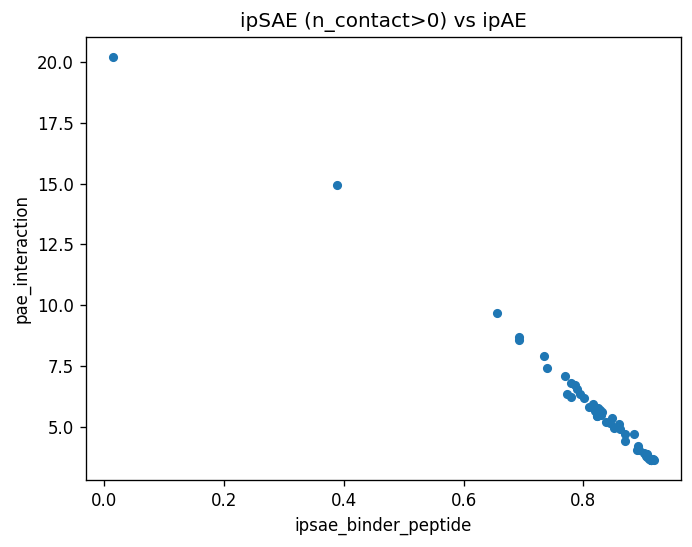

In [8]:
rho, p_value = spearmanr(merged_df['ipsae_binder_peptide'], merged_df['pae_interaction'])
print(f"Spearman: {rho}, p_value={p_value}")
merged_df.plot.scatter(x='ipsae_binder_peptide', y='pae_interaction', title='ipSAE (n_contact>0) vs ipAE')
plt.show()

In [9]:
merged_df.to_csv('~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_ipae_ipsae_scores.csv')

Spearman: -0.9697825859746574, p_value=1.0112039917754783e-13


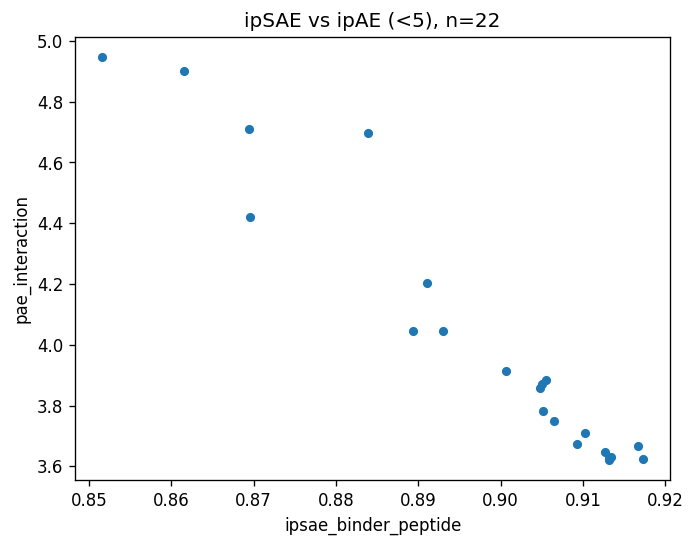

In [10]:
filtered_merged_df = merged_df[merged_df['pae_interaction']<5]
rho, p_value = spearmanr(filtered_merged_df['ipsae_binder_peptide'], filtered_merged_df['pae_interaction'])
print(f"Spearman: {rho}, p_value={p_value}")
filtered_merged_df.plot.scatter(x='ipsae_binder_peptide', y='pae_interaction', title=f"ipSAE vs ipAE (<5), n={len(filtered_merged_df)}")
plt.show()

Spearman: -0.9825463712249991, p_value=6.791646441995084e-28


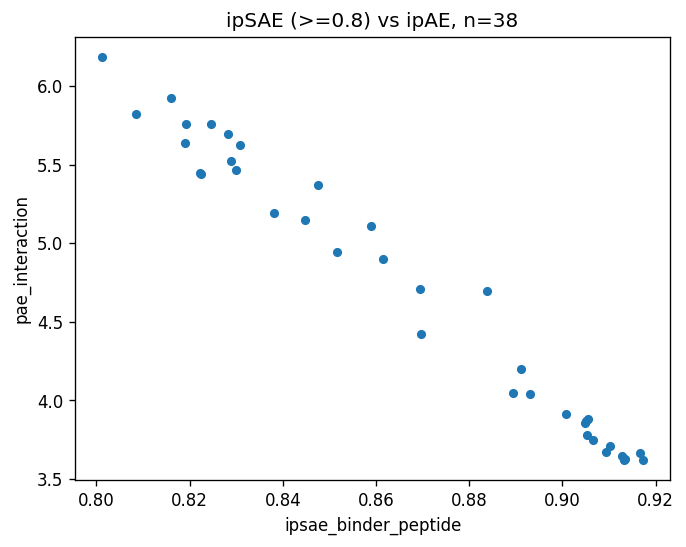

In [11]:
filtered_merged_df = merged_df[merged_df['ipsae_binder_peptide']>=0.8]
rho, p_value = spearmanr(filtered_merged_df['ipsae_binder_peptide'], filtered_merged_df['pae_interaction'])
print(f"Spearman: {rho}, p_value={p_value}")
filtered_merged_df.plot.scatter(x='ipsae_binder_peptide', y='pae_interaction', title=f"ipSAE (>=0.8) vs ipAE, n={len(filtered_merged_df)}")
plt.show()

**Observation:** ipSAE and ipAE aren't as highly correlated in the top designs. 

**Question:** Which one should we use? ipSAE >= 0.8 or ipAE < 5?

**Visualize:**

1. 3D structures
2. Check the sequences

In [12]:
from analyze_af2_scores import view_candidates

In [13]:
pdbs = sorted(glob.glob("~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/*.pdb"))
top = pd.read_csv("~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras_passing.csv")
view_candidates(pdbs, top_df=top, cols=3)

Viewing 20 structures  (7 rows × 3 cols)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Both filters:       22
iPAE only (<5):     0
ipSAE only (≥0.8):  16
Neither:            14


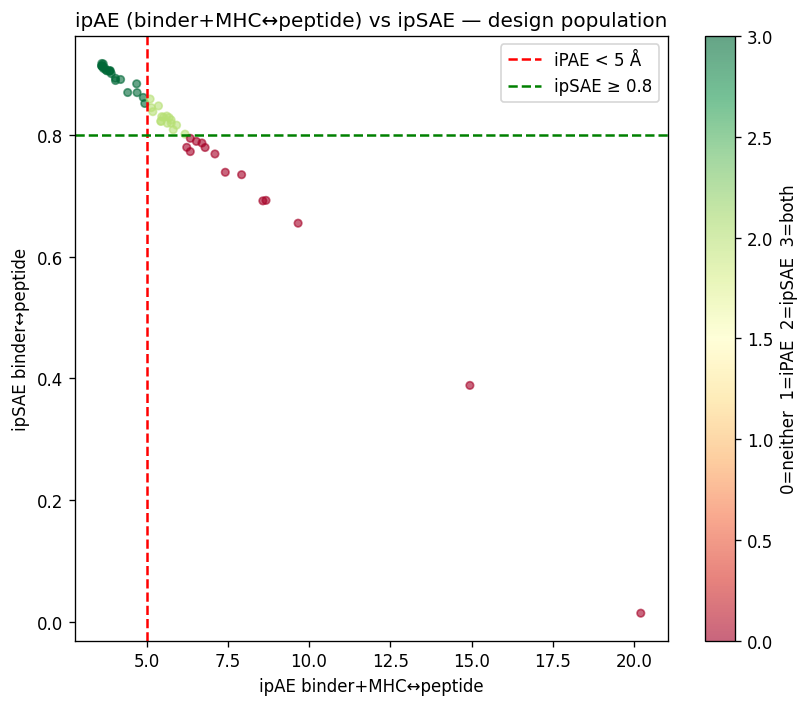

In [14]:
# Classify each design
merged_df['pass_ipae']  = merged_df['pae_interaction']           < 5.0   # iPAE = pae_interaction (same as Science paper authors)
merged_df['pass_ipsae'] = merged_df['ipsae_binder_peptide']  >= 0.8

# Venn-style counts
both      = (merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
ipae_only = (merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()
ipsae_only= (~merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
neither   = (~merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()

print(f"Both filters:       {both}")
print(f"iPAE only (<5):     {ipae_only}")
print(f"ipSAE only (≥0.8):  {ipsae_only}")
print(f"Neither:            {neither}")

# Scatter plot
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(merged_df['pae_interaction'], merged_df['ipsae_binder_peptide'],
                c=merged_df['pass_ipae'].astype(int) + merged_df['pass_ipsae'].astype(int) * 2,
                cmap='RdYlGn', alpha=0.6, s=20)
ax.axvline(5.0, color='red',   linestyle='--', label='iPAE < 5 Å')
ax.axhline(0.8, color='green', linestyle='--', label='ipSAE ≥ 0.8')
ax.set_xlabel('ipAE binder+MHC↔peptide')
ax.set_ylabel('ipSAE binder↔peptide')
ax.set_title('ipAE (binder+MHC↔peptide) vs ipSAE — design population')
ax.legend()
plt.colorbar(sc, ax=ax, label='0=neither  1=iPAE  2=ipSAE  3=both')
plt.tight_layout()
fig

Both filters:       37
iPAE only (<5):     0
ipSAE only (≥0.8):  1
Neither:            14


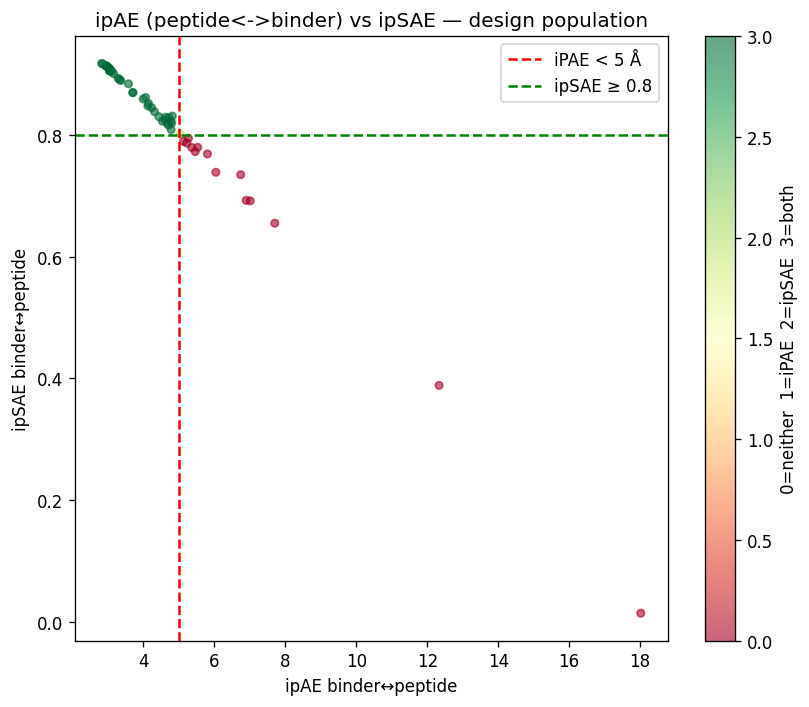

In [15]:
# Classify each design
merged_df['pass_ipae']  = merged_df['mean_pae_bp']           < 5.0   # iPAE = mean_pae_bp (different from Science paper authors)
merged_df['pass_ipsae'] = merged_df['ipsae_binder_peptide']  >= 0.8

# Venn-style counts
both      = (merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
ipae_only = (merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()
ipsae_only= (~merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
neither   = (~merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()

print(f"Both filters:       {both}")
print(f"iPAE only (<5):     {ipae_only}")
print(f"ipSAE only (≥0.8):  {ipsae_only}")
print(f"Neither:            {neither}")

# Scatter plot
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(merged_df['mean_pae_bp'], merged_df['ipsae_binder_peptide'],
                c=merged_df['pass_ipae'].astype(int) + merged_df['pass_ipsae'].astype(int) * 2,
                cmap='RdYlGn', alpha=0.6, s=20)
ax.axvline(5.0, color='red',   linestyle='--', label='iPAE < 5 Å')
ax.axhline(0.8, color='green', linestyle='--', label='ipSAE ≥ 0.8')
ax.set_xlabel('ipAE binder↔peptide')
ax.set_ylabel('ipSAE binder↔peptide')
ax.set_title('ipAE (peptide<->binder) vs ipSAE — design population')
ax.legend()
plt.colorbar(sc, ax=ax, label='0=neither  1=iPAE  2=ipSAE  3=both')
plt.tight_layout()
fig

I'd use the ipSAE > 0.8 backbones/sequences. Output all the selected pdbs.

In [16]:
import os
from analyze_af2_scores import extract_top_pdbs
os.environ['PATH'] += os.pathsep + '~/Desktop/pmhc_binder_kras_cp/silent_tools'
import pyrosetta
from pyrosetta import *
init("-mute all -ignore_unrecognized_res true")

┌───────────────────────────────────────────────────────────────────────────────┐
│                                  PyRosetta-4                                  │
│               Created in JHU by Sergey Lyskov and PyRosetta Team              │
│               (C) Copyright Rosetta Commons Member Institutions               │
│                                                                               │
│ NOTE: USE OF PyRosetta FOR COMMERCIAL PURPOSES REQUIRES PURCHASE OF A LICENSE │
│          See LICENSE.PyRosetta.md or email license@uw.edu for details         │
└───────────────────────────────────────────────────────────────────────────────┘
PyRosetta-4 2026 [Rosetta PyRosetta4.Release.python311.ubuntu 2026.03+releasequarterly.5e498f1409c68ade56c8ce5842bf79e1b02e8db4 2026-01-13T13:24:11] retrieved from: http://www.pyrosetta.org


In [34]:
import importlib
import analyze_af2_scores
importlib.reload(analyze_af2_scores)
from analyze_af2_scores import extract_top_pdbs

In [35]:
merged_df = pd.read_csv('~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_ipae_ipsae_scores.csv')
merged_df.head()
merged_df.rename(columns={'label': 'description'}, inplace=True)
top=merged_df[merged_df['ipsae_binder_peptide']>=0.8]
extract_top_pdbs(top, silent_dir='~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras', 
                 out_dir='~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs')

38

Extracting 38 PDBs from silent files
  af2_kras_predictions.silent: extracting 38 tag(s)
core.init: Rosetta version: PyRosetta4.Release.python311.ubuntu r1 2026.03+releasequarterly.5e498f1409 5e498f1409c68ade56c8ce5842bf79e1b02e8db4 http://www.pyrosetta.org 2026-01-13T13:24:11
core.init: Rosetta extras: []
core.init: command: PyRosetta -in:file:silent tmp_5Y6vU2dToeGRe.silent -in:file:silent_struct_type binary -database ~/Desktop/pmhc_binder_kras/envs/dl_binder_design/lib/python3.11/site-packages/pyrosetta/database
basic.random.init_random_generator: 'RNG device' seed mode, using '/dev/urandom', seed=2118876346 seed_offset=0 real_seed=2118876346
basic.random.init_random_generator: RandomGenerator:init: Normal mode, seed=2118876346 RG_type=mt19937
core.io.silent.SilentFileData: Reading all structures from tmp_5Y6vU2dToeGRe.silent
core.io.silent.SilentFileData: Finished reading 38 structures from tmp_5Y6vU2dToeGRe.silent
core.chemical.GlobalResidueTypeSet: Finished initializing fa_st

['~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/orient_252_pt20__31_sample06_a11_t0.15_s7_af2pred.pdb',
 '~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/orient_252_pt20__31_sample06_a13_t0.15_s4_af2pred.pdb',
 '~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/orient_252_pt20__31_sample06_a3_t0.1_s5_af2pred.pdb',
 '~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/orient_252_pt20__31_sample06_a4_t0.1_s5_af2pred.pdb',
 '~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/orient_252_pt20__31_sample06_a6_t0.1_s1_af2pred.pdb',
 '~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/orient_252_pt20__31_sample06_a8_t0.1_s5_af2pred.pdb',
 '~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/orient_252_pt20__31_sample06_a8_t0.1_s8_af2pred.pdb',
 '~/Desktop/pmhc_binder_kras_cp/af_init_guess/outputs/r2.5/af2_kras/top_pdbs/or